In [1]:
library(tidyverse, verbose = FALSE)
library(lubridate, verbose = FALSE)
library(forecast, verbose = FALSE)
library(car, verbose = FALSE)
library(boot, verbose = FALSE)
library(zoo, verbose = FALSE)
library(plotly, verbose = FALSE)
library(ggplot2, verbose = FALSE)
library(factoextra, verbose = FALSE)
cities <- c(
  "New York", "Los Angeles", "Chicago", "Houston", "Phoenix",
  "Philadelphia", "San Antonio", "San Diego", "Dallas", "San Jose"
)
set.seed(5100)

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.1 ──

✔ ggplot2 4.0.0     ✔ purrr   1.1.0
✔ tibble  3.3.0     ✔ dplyr   1.1.4
✔ tidyr   1.3.1     ✔ stringr 1.5.2
✔ readr   2.1.5     ✔ forcats 0.5.1

── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ purrr::%||%()   masks base::%||%()
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()


Attaching package: ‘lubridate’


The following objects are masked from ‘package:base’:

    date, intersect, setdiff, union


Registered S3 method overwritten by 'quantmod':
  method            from
  as.zoo.data.frame zoo 

Loading required package: carData


Attaching package: ‘car’


The following object is masked from ‘package:dplyr’:

    recode


The following object is masked from ‘package:purrr’:

    some



Attaching package: ‘boot’


The following object is masked from ‘package:car’:

    logit



Attaching package: ‘zoo’


The following objects are masked fr

# Load Pollutant Data

In [2]:
pm25_raw <- read_csv("../../data/daily_88101_2023.csv", show_col_types = FALSE)
o3_raw   <- read_csv("../../data/daily_44201_2023.csv", show_col_types = FALSE)
no2_raw  <- read_csv("../../data/daily_42602_2023.csv", show_col_types = FALSE)

clean_pollutant <- function(df, pollutant_name) {
  df %>%
    filter(`City Name` %in% cities) %>%          # filter ROWS by city name
    mutate(Date = ymd(`Date Local`)) %>%         # convert date
    select(`City Name`, Date, `Arithmetic Mean`) %>%  # select correct columns
    rename(
      City = `City Name`,
      !!pollutant_name := `Arithmetic Mean`
    )
} 

pm25 <- clean_pollutant(pm25_raw, "PM25")
o3   <- clean_pollutant(o3_raw,   "O3")
# Convert o3 from ppm to ppb
o3 <- o3 %>%
  mutate(O3 = O3 * 1000)

no2  <- clean_pollutant(no2_raw,  "NO2")

air_df <- pm25 %>%
  inner_join(o3, by = c("City", "Date")) %>%
  inner_join(no2, by = c("City", "Date"))

# There are duplicate rows as the indicators have multiple monitoring sites per city. 
air_df_clean <- air_df %>%
  group_by(City, Date) %>%
  summarise(
    PM25 = mean(PM25, na.rm = TRUE),
    O3   = mean(O3,   na.rm = TRUE),
    NO2  = mean(NO2,  na.rm = TRUE),
    .groups = "drop"
  ) %>%
  arrange(City, Date)

head(air_df_clean)

Warning message in inner_join(., o3, by = c("City", "Date")):
“Detected an unexpected many-to-many relationship between `x` and `y`.
ℹ Row 1 of `x` matches multiple rows in `y`.
ℹ Row 12 of `y` matches multiple rows in `x`.
ℹ If a many-to-many relationship is expected, set `relationship =
  "many-to-many"` to silence this warning.”
Warning message in inner_join(., no2, by = c("City", "Date")):
“Detected an unexpected many-to-many relationship between `x` and `y`.
ℹ Row 1 of `x` matches multiple rows in `y`.
ℹ Row 12 of `y` matches multiple rows in `x`.
ℹ If a many-to-many relationship is expected, set `relationship =
  "many-to-many"` to silence this warning.”


City,Date,PM25,O3,NO2
<chr>,<date>,<dbl>,<dbl>,<dbl>
Chicago,2023-03-01,9.166667,26.43133,15.797916
Chicago,2023-03-02,2.800000,36.49033,9.470833
Chicago,2023-03-04,16.100000,21.09800,19.579167
Chicago,2023-03-07,3.150000,38.09800,6.368750
Chicago,2023-03-10,3.300000,33.85300,10.012500
Chicago,2023-03-13,4.175000,32.26450,11.920265


## Load Weather Data

In [ ]:
# load weather data for all cities
city_weather_dfs <- list()
for (city in cities) {
    df <- read_csv(paste0("../../data/weather_data/", city, ".csv"), show_col_types = FALSE)

    # mutate date to not have time component
    df <- df %>%
      mutate(date = as.Date(date))

    city_weather_dfs[[city]] <- df
}

weather = "relative_humidity_2m_mean"
name = "Humidity (%)"

In [4]:
merge_weather_air <- function(city) {
  df <- city_weather_dfs[[city]]
  df <- df %>%
    inner_join(air_df_clean %>% filter(City == city), by = c("date" = "Date")) %>%
    select(date, City, temperature_2m_mean, cloud_cover_mean, relative_humidity_2m_mean, wind_gusts_10m_mean, wind_speed_10m_mean, precipitation_hours, precipitation_sum, PM25, O3, NO2)
  return(df)
}

total_df <- data.frame()
for (city in cities) {
    df <- merge_weather_air(city)
    total_df <- rbind(total_df, df)
}

# Data Visualization

## All Cities

### Scatter Plots - Temperature vs Pollutants 

HTML widgets cannot be represented in plain text (need html)

HTML widgets cannot be represented in plain text (need html)

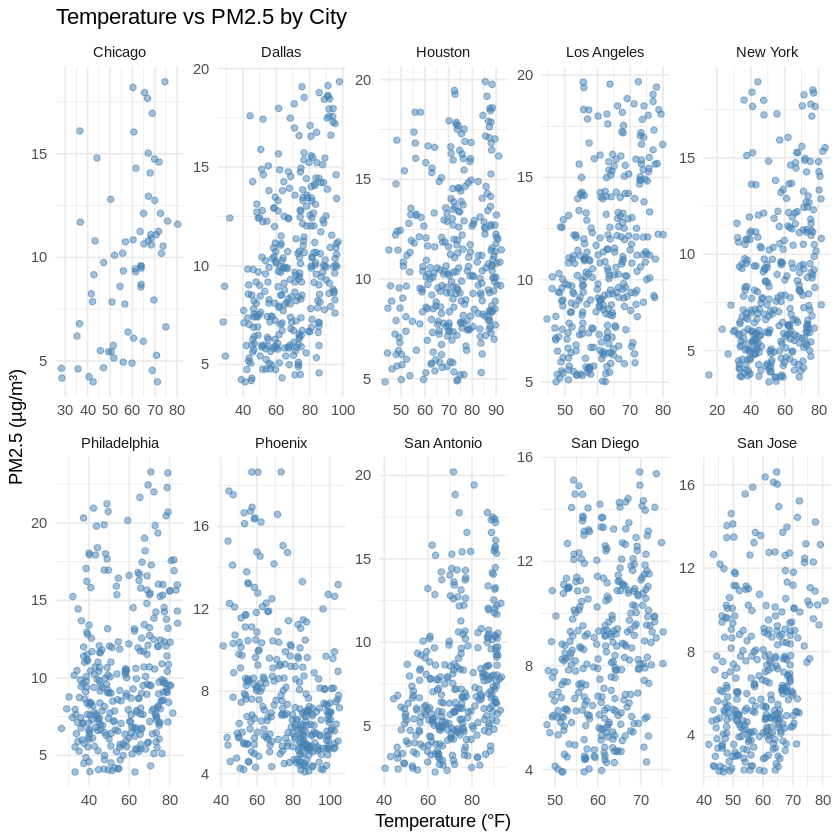

HTML widgets cannot be represented in plain text (need html)

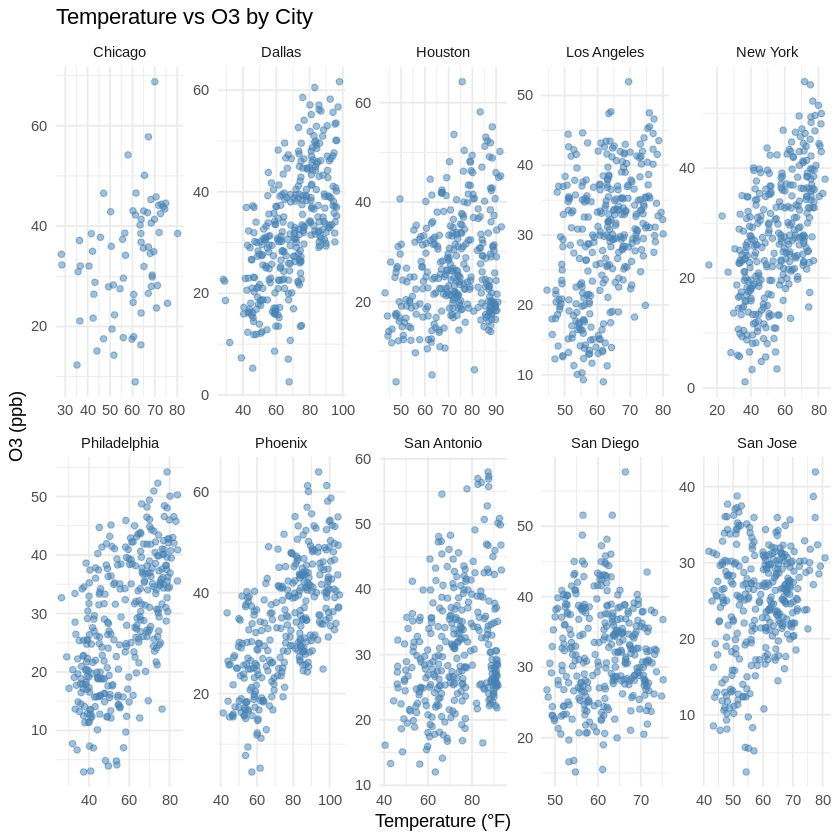

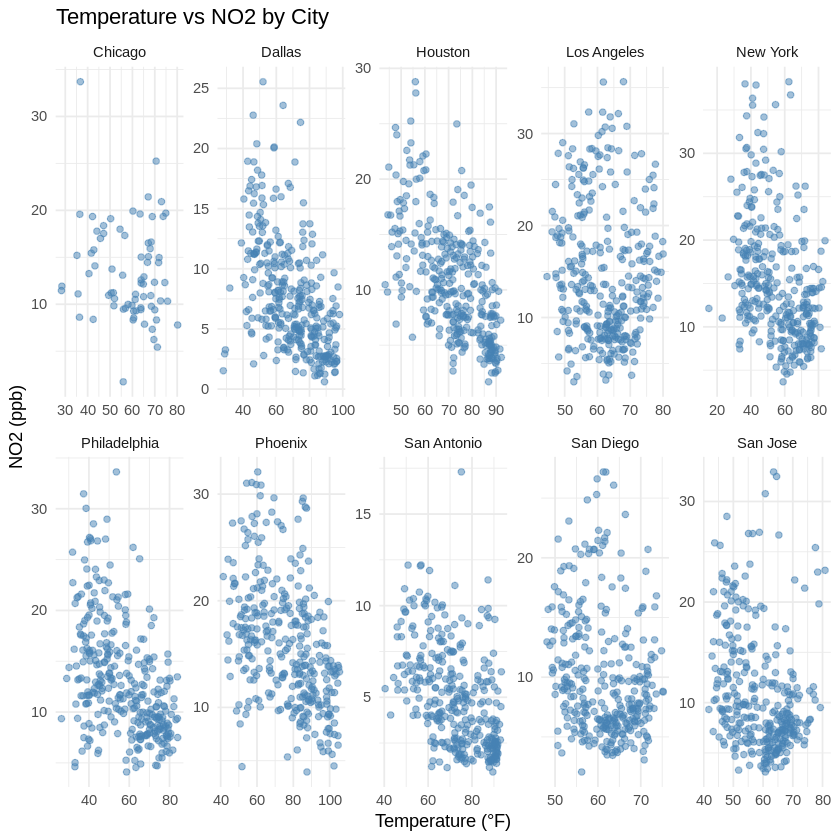

In [5]:
# remove PM2.5 outliers
total_df <- total_df %>%
  group_by(City) %>%
  filter(between(PM25, quantile(PM25, 0.05, na.rm = TRUE), quantile(PM25, 0.95, na.rm = TRUE))) %>%
  ungroup()

#### PM2.5 vs Temperature scatter
plot_ly(
  data = total_df,
  x = ~total_df[[weather]],
  y = ~PM25,
  z = ~as.numeric(as.factor(City)),
  type = "scatter3d",
  mode = "markers",
  color = ~City,
  colors = "Set3",
  marker = list(size = 3)
) %>%
  layout(
    title = paste("3D Scatter Plot of", name, "vs PM2.5 by City"),
    scene = list(
      xaxis = list(title = paste(name)),
      yaxis = list(title = "PM2.5 (µg/m³)"),
      zaxis = list(title = "City")
    )
  )
ggplot(total_df, aes(x = temperature_2m_mean, y = PM25)) +
  geom_point(alpha = 0.5, color = "steelblue") +
  facet_wrap(~ City, ncol = 5, scales = "free") +
  labs(
    title = "Temperature vs PM2.5 by City",
    x = "Temperature (°F)",
    y = "PM2.5 (µg/m³)"
  ) +
  theme_minimal()

#### O3
plot_ly(
  data = total_df,
  x = ~temperature_2m_mean,
  y = ~O3,
  z = ~as.numeric(as.factor(City)),
  type = "scatter3d",
  mode = "markers",
  color = ~City,
  colors = "Set3",
  marker = list(size = 3)
) %>%
  layout(
    title = "3D Scatter Plot of Temperature vs O3 by City",
    scene = list(
      xaxis = list(title = "Temperature (°F)"),
      yaxis = list(title = "O3 (ppb)"),
      zaxis = list(title = "City")
    )
  )
ggplot(total_df, aes(x = temperature_2m_mean, y = O3)) +
  geom_point(alpha = 0.5, color = "steelblue") +
  facet_wrap(~ City, ncol = 5, scales = "free") +
  labs(
    title = "Temperature vs O3 by City",
    x = "Temperature (°F)",
    y = "O3 (ppb)"
  ) +
  theme_minimal()

#### NO2
plot_ly(
  data = total_df,
  x = ~temperature_2m_mean,
  y = ~NO2,
  z = ~as.numeric(as.factor(City)),
  type = "scatter3d",
  mode = "markers",
  color = ~City,
  colors = "Set3",
  marker = list(size = 3)
) %>%
  layout(
    title = "3D Scatter Plot of Temperature vs NO2 by City",
    scene = list(
      xaxis = list(title = "Temperature (°F)"),
      yaxis = list(title = "NO2 (ppb)"),
      zaxis = list(title = "City")
    )
  )
ggplot(total_df, aes(x = temperature_2m_mean, y = NO2)) +
  geom_point(alpha = 0.5, color = "steelblue") +
  facet_wrap(~ City, ncol = 5, scales = "free") +
  labs(
    title = "Temperature vs NO2 by City",
    x = "Temperature (°F)",
    y = "NO2 (ppb)"
  ) +
  theme_minimal()




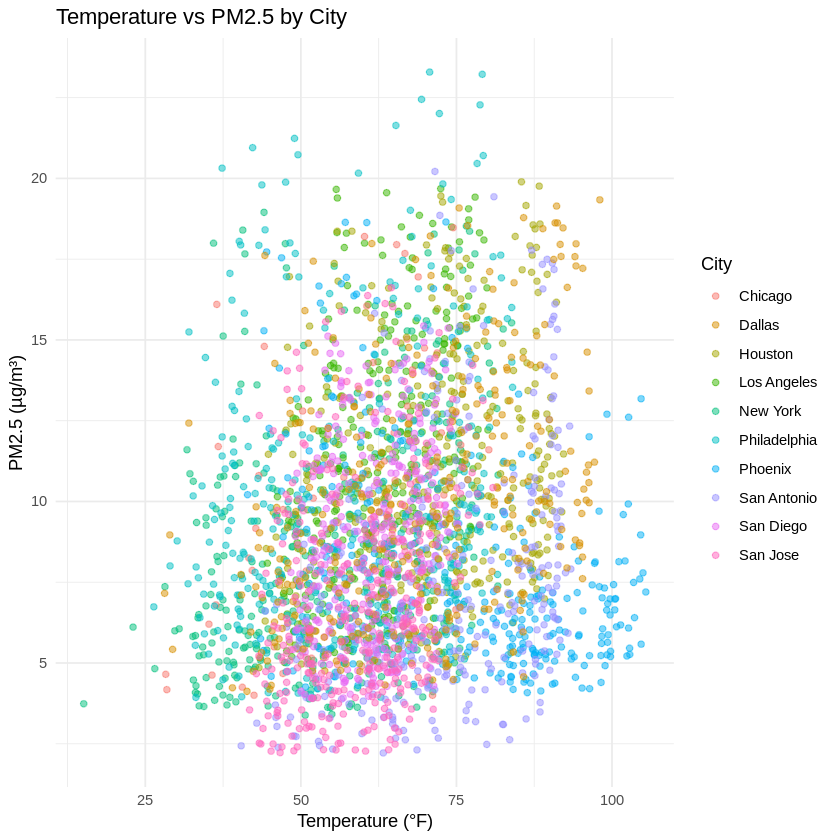

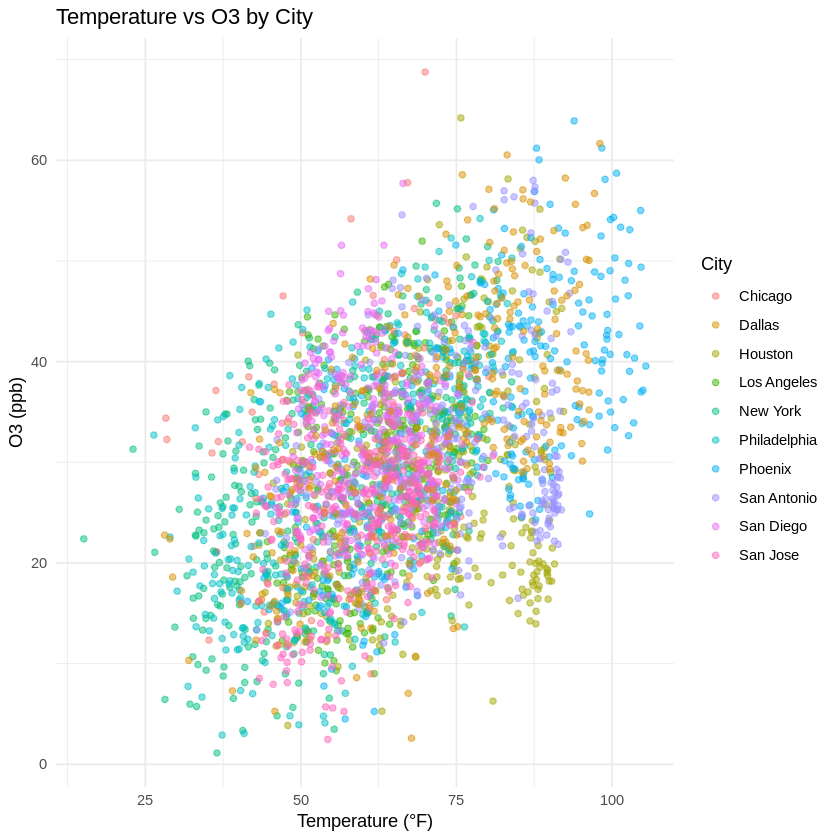

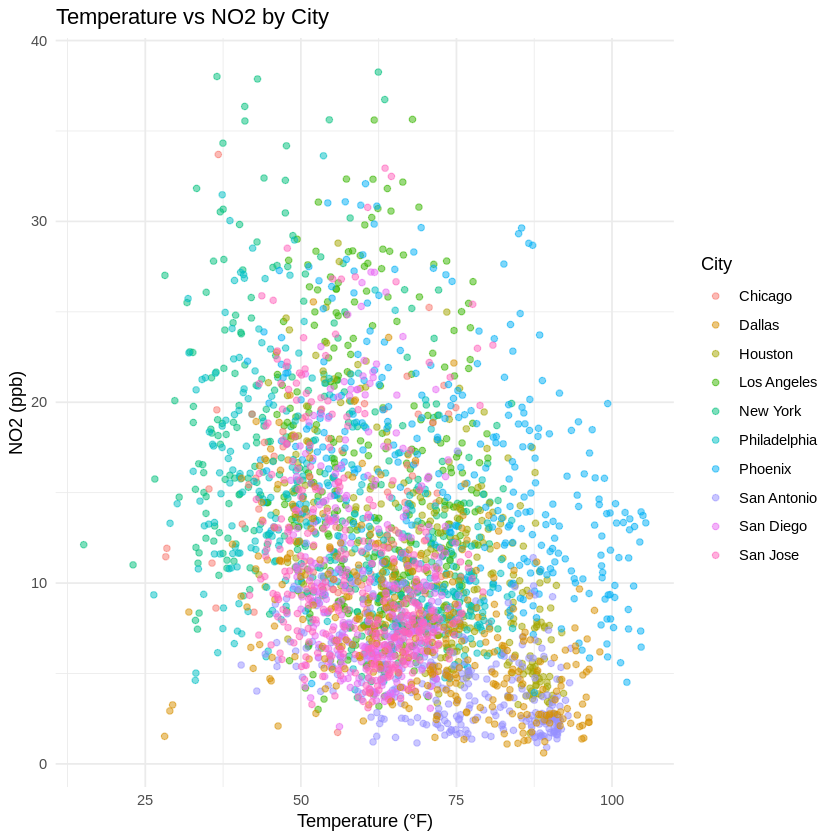

In [6]:
# plot all cities on one scatter plto by color
ggplot(total_df, aes(x = temperature_2m_mean, y = PM25, color = City)) +
  geom_point(alpha = 0.5) +
  labs(
    title = "Temperature vs PM2.5 by City",
    x = "Temperature (°F)",
    y = "PM2.5 (µg/m³)"
  ) +
  theme_minimal()

# O3
ggplot(total_df, aes(x = temperature_2m_mean, y = O3, color = City)) +
  geom_point(alpha = 0.5) +
  labs(
    title = "Temperature vs O3 by City",
    x = "Temperature (°F)",
    y = "O3 (ppb)"
  ) +
  theme_minimal()

# NO2
ggplot(total_df, aes(x = temperature_2m_mean, y = NO2, color = City)) +
  geom_point(alpha = 0.5) +
  labs(
    title = "Temperature vs NO2 by City",
    x = "Temperature (°F)",
    y = "NO2 (ppb)"
  ) +
  theme_minimal()